# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

In [5]:
# Test: Know about trainset
type(trainset)
trainset.keys()
trainset["X"].shape
testset["X"].shape
trainset["X"][:10]

array([[[[ 33,  84,  19, ...,  92, 190, 216],
         [ 30,  76,  54, ...,  78, 188, 217],
         [ 38,  59, 110, ..., 101, 191, 212]],

        [[ 15,  86,  20, ...,  94, 205, 221],
         [ 23,  73,  52, ...,  82, 203, 222],
         [ 19,  66, 111, ..., 105, 206, 217]],

        [[ 15,  77,  25, ..., 114, 220, 226],
         [ 17,  78,  57, ..., 101, 218, 227],
         [ 19,  56, 116, ..., 125, 220, 221]],

        ..., 
        [[ 72,  90,  65, ..., 200, 229, 200],
         [ 65,  78, 144, ..., 201, 231, 199],
         [ 56,  69, 223, ..., 203, 224, 191]],

        [[ 82,  88,  78, ..., 192, 229, 193],
         [ 77,  77, 148, ..., 193, 229, 188],
         [ 57,  67, 218, ..., 195, 224, 182]],

        [[ 89,  88,  98, ..., 190, 229, 197],
         [ 79,  78, 158, ..., 191, 228, 189],
         [ 59,  66, 220, ..., 193, 223, 186]]],


       [[[ 28,  85,  21, ...,  92, 183, 204],
         [ 39,  77,  53, ...,  78, 182, 205],
         [ 35,  61, 110, ..., 103, 186, 202]],

    

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

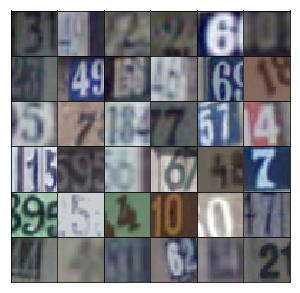

In [6]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [7]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [8]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [9]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [10]:
def generator(z, output_dim, reuse=False, alpha=0.2, lmbda=0.1, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        fully = tf.layers.dense(z, 4*4*512)
        fully = tf.reshape(fully, (-1,4,4,512))
        fully = tf.layers.batch_normalization(fully, training=training)
        fully = tf.maximum(alpha*fully, fully)
        # Conv1: 8*8*256
        conv1 = tf.layers.conv2d_transpose(fully, 256, kernel_size=(3,3), strides=(2,2), padding='same', 
                                           kernel_regularizer=tf.contrib.layers.l2_regularizer(lmbda))
        conv1 = tf.layers.batch_normalization(conv1, training=training)
        conv1 = tf.maximum(alpha*conv1, conv1)
        # Conv2: 16*16*128
        conv2 = tf.layers.conv2d_transpose(conv1, 128, kernel_size=(3,3), strides=(2,2), padding='same',
                                           kernel_regularizer=tf.contrib.layers.l2_regularizer(lmbda))
        conv2 = tf.layers.batch_normalization(conv2, training=training)
        conv2 = tf.maximum(alpha*conv2, conv2)
        # Output layer: 32*32*3
        logits = tf.layers.conv2d_transpose(conv2, 3, kernel_size=(3,3), strides=(2,2), padding='same',
                                           kernel_regularizer=tf.contrib.layers.l2_regularizer(lmbda))       
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've built before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [11]:
def discriminator(x, reuse=False, alpha=0.2, lmbda=0.1):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        # Conv1: 16*16*64
        conv1 = tf.layers.conv2d(x, 64, kernel_size=(3,3), strides=(2,2), padding="same",
                                 kernel_regularizer=tf.contrib.layers.l2_regularizer(lmbda))
        #conv1 = tf.layers.batch_normalization(conv1, training=True)
        conv1 = tf.maximum(alpha*conv1, conv1)
        # Conv2: 8*8*128
        conv2 = tf.layers.conv2d(conv1, 128, kernel_size=(3,3), strides=(2,2), padding="same",
                                 kernel_regularizer=tf.contrib.layers.l2_regularizer(lmbda))
        conv2 = tf.layers.batch_normalization(conv2, training=True)
        conv2 = tf.maximum(alpha*conv2, conv2)
        # Conv3: 4*4*256
        conv3 = tf.layers.conv2d(conv1, 256, kernel_size=(3,3), strides=(2,2), padding="same",
                                 kernel_regularizer=tf.contrib.layers.l2_regularizer(lmbda))
        conv3 = tf.layers.batch_normalization(conv3, training=True)
        conv3 = tf.maximum(alpha*conv3, conv3)
        # Fully layer: 
        flat = tf.reshape(conv3, (-1,4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [12]:
def model_loss(input_real, input_z, output_dim, alpha=0.2, lmbda=0.1):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha, lmbda=lmbda)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha, lmbda=lmbda)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha, lmbda=lmbda)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)*0.95))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [13]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [14]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5, lmbda=0.1):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha, lmbda)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [15]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [16]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [ ]:
real_size = (32,32,3)
z_size = 128
learning_rate = 0.0002
batch_size = 256
epochs = 25
alpha = 0.1
beta1 = 0.5
lmbda = 0.1

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1, lmbda=lmbda)

Epoch 1/25... Discriminator Loss: 2.3712... Generator Loss: 0.2183
Epoch 1/25... Discriminator Loss: 1.5431... Generator Loss: 0.6183
Epoch 1/25... Discriminator Loss: 1.3214... Generator Loss: 0.7310
Epoch 1/25... Discriminator Loss: 1.4590... Generator Loss: 0.7409
Epoch 1/25... Discriminator Loss: 1.2996... Generator Loss: 0.9054
Epoch 1/25... Discriminator Loss: 0.9021... Generator Loss: 1.2486
Epoch 1/25... Discriminator Loss: 0.8131... Generator Loss: 1.4478
Epoch 1/25... Discriminator Loss: 0.8298... Generator Loss: 1.3618
Epoch 1/25... Discriminator Loss: 0.8454... Generator Loss: 1.1978
Epoch 1/25... Discriminator Loss: 0.6876... Generator Loss: 1.5078


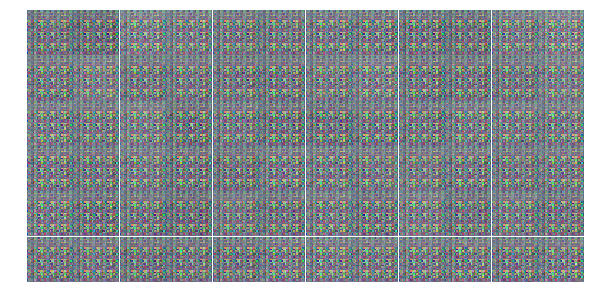

Epoch 1/25... Discriminator Loss: 0.6890... Generator Loss: 1.4544
Epoch 1/25... Discriminator Loss: 0.7045... Generator Loss: 1.5071
Epoch 1/25... Discriminator Loss: 0.6057... Generator Loss: 1.9201
Epoch 1/25... Discriminator Loss: 0.5431... Generator Loss: 1.8107
Epoch 1/25... Discriminator Loss: 0.6318... Generator Loss: 1.5732
Epoch 1/25... Discriminator Loss: 0.6225... Generator Loss: 1.5506
Epoch 1/25... Discriminator Loss: 0.8145... Generator Loss: 1.3794
Epoch 1/25... Discriminator Loss: 0.7729... Generator Loss: 1.3573
Epoch 1/25... Discriminator Loss: 0.8011... Generator Loss: 1.4391
Epoch 1/25... Discriminator Loss: 0.8300... Generator Loss: 1.2883


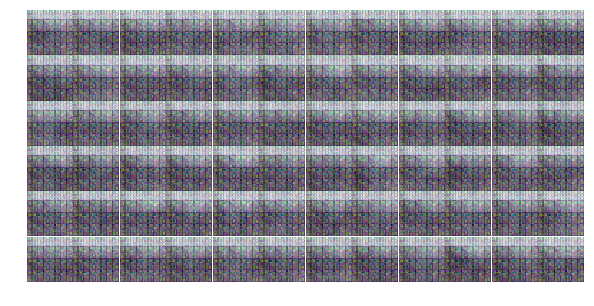

Epoch 1/25... Discriminator Loss: 0.9733... Generator Loss: 1.1671
Epoch 1/25... Discriminator Loss: 0.8630... Generator Loss: 1.2136
Epoch 1/25... Discriminator Loss: 1.0498... Generator Loss: 1.1164
Epoch 1/25... Discriminator Loss: 1.0468... Generator Loss: 0.9644
Epoch 1/25... Discriminator Loss: 0.9814... Generator Loss: 1.0523
Epoch 1/25... Discriminator Loss: 0.8857... Generator Loss: 1.1614
Epoch 1/25... Discriminator Loss: 1.0350... Generator Loss: 1.1426
Epoch 1/25... Discriminator Loss: 0.9327... Generator Loss: 1.1118
Epoch 2/25... Discriminator Loss: 0.9537... Generator Loss: 1.1326
Epoch 2/25... Discriminator Loss: 0.8810... Generator Loss: 1.2264


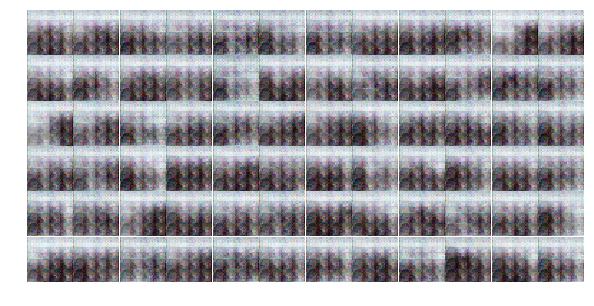

Epoch 2/25... Discriminator Loss: 0.9707... Generator Loss: 1.1407
Epoch 2/25... Discriminator Loss: 0.8218... Generator Loss: 1.2892
Epoch 2/25... Discriminator Loss: 0.8848... Generator Loss: 1.1948
Epoch 2/25... Discriminator Loss: 0.7431... Generator Loss: 1.3898
Epoch 2/25... Discriminator Loss: 0.9067... Generator Loss: 1.2518
Epoch 2/25... Discriminator Loss: 0.7684... Generator Loss: 1.3023
Epoch 2/25... Discriminator Loss: 0.7864... Generator Loss: 1.3248
Epoch 2/25... Discriminator Loss: 0.7230... Generator Loss: 1.4637
Epoch 2/25... Discriminator Loss: 0.7072... Generator Loss: 1.3968
Epoch 2/25... Discriminator Loss: 0.6976... Generator Loss: 1.4585


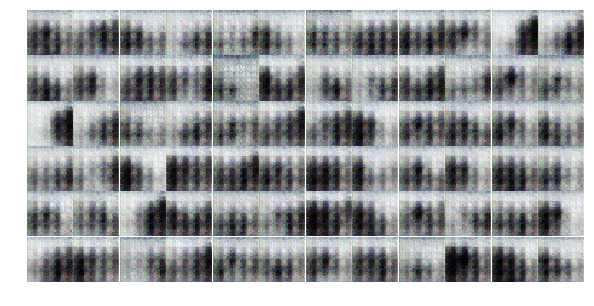

Epoch 2/25... Discriminator Loss: 0.7328... Generator Loss: 1.3713
Epoch 2/25... Discriminator Loss: 0.6900... Generator Loss: 1.4066
Epoch 2/25... Discriminator Loss: 0.9349... Generator Loss: 1.1745
Epoch 2/25... Discriminator Loss: 0.9689... Generator Loss: 0.9783
Epoch 2/25... Discriminator Loss: 1.0485... Generator Loss: 1.0004
Epoch 2/25... Discriminator Loss: 1.1144... Generator Loss: 1.0022
Epoch 2/25... Discriminator Loss: 1.0642... Generator Loss: 1.0764
Epoch 2/25... Discriminator Loss: 1.0276... Generator Loss: 1.2160
Epoch 2/25... Discriminator Loss: 1.0295... Generator Loss: 1.1554
Epoch 2/25... Discriminator Loss: 0.8219... Generator Loss: 1.5910


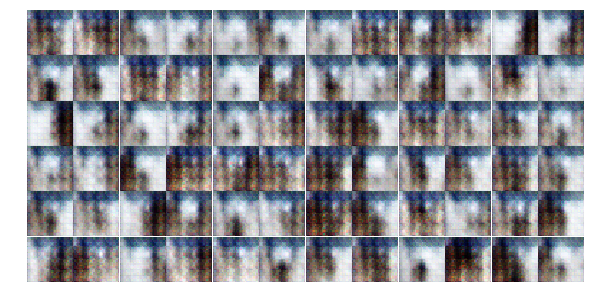

Epoch 2/25... Discriminator Loss: 1.2468... Generator Loss: 0.7940
Epoch 2/25... Discriminator Loss: 0.9391... Generator Loss: 1.1544
Epoch 2/25... Discriminator Loss: 0.8055... Generator Loss: 1.7100
Epoch 2/25... Discriminator Loss: 0.9671... Generator Loss: 1.2643
Epoch 2/25... Discriminator Loss: 0.8560... Generator Loss: 1.2106
Epoch 2/25... Discriminator Loss: 0.8125... Generator Loss: 1.5348
Epoch 2/25... Discriminator Loss: 0.9200... Generator Loss: 1.0617
Epoch 3/25... Discriminator Loss: 0.7075... Generator Loss: 1.7528
Epoch 3/25... Discriminator Loss: 0.7443... Generator Loss: 1.4174
Epoch 3/25... Discriminator Loss: 0.7756... Generator Loss: 1.4261


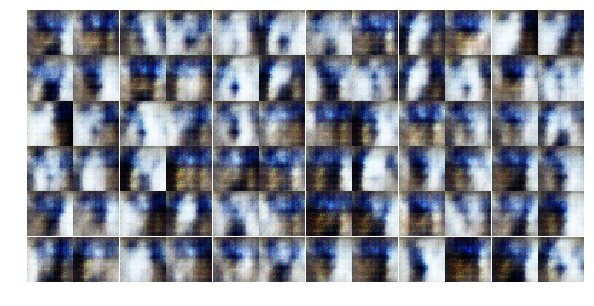

Epoch 3/25... Discriminator Loss: 0.7569... Generator Loss: 1.3304
Epoch 3/25... Discriminator Loss: 0.8351... Generator Loss: 1.1779
Epoch 3/25... Discriminator Loss: 0.8632... Generator Loss: 1.1544
Epoch 3/25... Discriminator Loss: 0.7194... Generator Loss: 1.6172
Epoch 3/25... Discriminator Loss: 0.7633... Generator Loss: 1.2054
Epoch 3/25... Discriminator Loss: 0.6624... Generator Loss: 1.7154
Epoch 3/25... Discriminator Loss: 0.6893... Generator Loss: 1.5193
Epoch 3/25... Discriminator Loss: 0.7977... Generator Loss: 1.2146
Epoch 3/25... Discriminator Loss: 0.6881... Generator Loss: 1.6930
Epoch 3/25... Discriminator Loss: 0.8415... Generator Loss: 1.0812


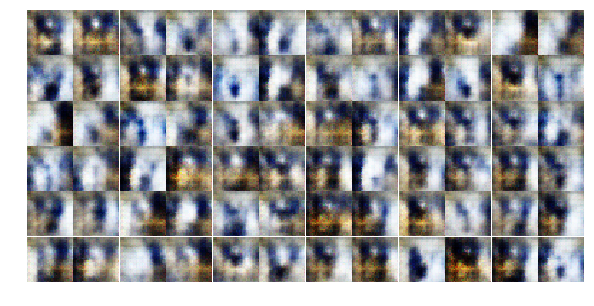

Epoch 3/25... Discriminator Loss: 1.0044... Generator Loss: 1.1005
Epoch 3/25... Discriminator Loss: 0.6302... Generator Loss: 2.3117
Epoch 3/25... Discriminator Loss: 0.7274... Generator Loss: 1.4964
Epoch 3/25... Discriminator Loss: 0.7066... Generator Loss: 1.5347
Epoch 3/25... Discriminator Loss: 0.7555... Generator Loss: 1.6104
Epoch 3/25... Discriminator Loss: 0.7113... Generator Loss: 1.4274
Epoch 3/25... Discriminator Loss: 0.7204... Generator Loss: 1.8889
Epoch 3/25... Discriminator Loss: 0.7011... Generator Loss: 1.4560
Epoch 3/25... Discriminator Loss: 0.7244... Generator Loss: 1.6010
Epoch 3/25... Discriminator Loss: 0.8416... Generator Loss: 1.4262


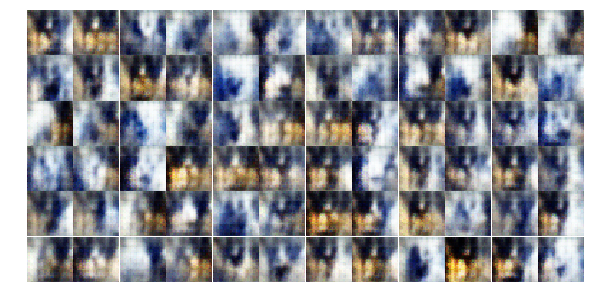

Epoch 3/25... Discriminator Loss: 0.7931... Generator Loss: 1.5559
Epoch 3/25... Discriminator Loss: 0.8238... Generator Loss: 1.4121
Epoch 3/25... Discriminator Loss: 1.0386... Generator Loss: 0.9324
Epoch 3/25... Discriminator Loss: 0.8844... Generator Loss: 1.1001
Epoch 3/25... Discriminator Loss: 0.8336... Generator Loss: 1.3142
Epoch 3/25... Discriminator Loss: 0.8133... Generator Loss: 1.3254
Epoch 4/25... Discriminator Loss: 0.8617... Generator Loss: 1.2158
Epoch 4/25... Discriminator Loss: 0.7931... Generator Loss: 1.3769
Epoch 4/25... Discriminator Loss: 0.8896... Generator Loss: 1.1760
Epoch 4/25... Discriminator Loss: 0.8499... Generator Loss: 1.1695


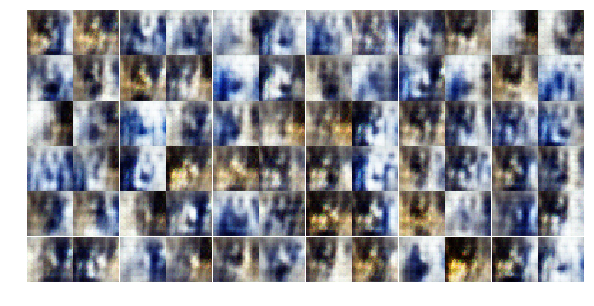

Epoch 4/25... Discriminator Loss: 0.8493... Generator Loss: 1.3215
Epoch 4/25... Discriminator Loss: 0.8173... Generator Loss: 1.1197
Epoch 4/25... Discriminator Loss: 0.7400... Generator Loss: 1.5398
Epoch 4/25... Discriminator Loss: 0.7664... Generator Loss: 1.4426
Epoch 4/25... Discriminator Loss: 0.8329... Generator Loss: 1.2692
Epoch 4/25... Discriminator Loss: 0.7471... Generator Loss: 1.4225
Epoch 4/25... Discriminator Loss: 0.7091... Generator Loss: 1.5174
Epoch 4/25... Discriminator Loss: 0.7000... Generator Loss: 1.7926
Epoch 4/25... Discriminator Loss: 0.9062... Generator Loss: 1.2186
Epoch 4/25... Discriminator Loss: 0.7591... Generator Loss: 1.8000


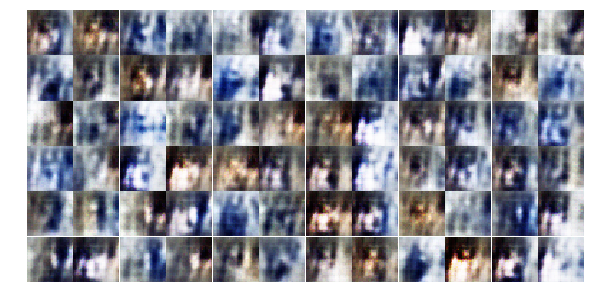

Epoch 4/25... Discriminator Loss: 0.9289... Generator Loss: 1.2542
Epoch 4/25... Discriminator Loss: 0.7621... Generator Loss: 1.4782
Epoch 4/25... Discriminator Loss: 0.9043... Generator Loss: 1.1841
Epoch 4/25... Discriminator Loss: 0.7254... Generator Loss: 1.7384
Epoch 4/25... Discriminator Loss: 0.9356... Generator Loss: 1.1749
Epoch 4/25... Discriminator Loss: 0.9265... Generator Loss: 0.9721
Epoch 4/25... Discriminator Loss: 0.7644... Generator Loss: 1.4264
Epoch 4/25... Discriminator Loss: 0.8651... Generator Loss: 1.1817
Epoch 4/25... Discriminator Loss: 0.9033... Generator Loss: 1.3887
Epoch 4/25... Discriminator Loss: 0.7387... Generator Loss: 1.7601


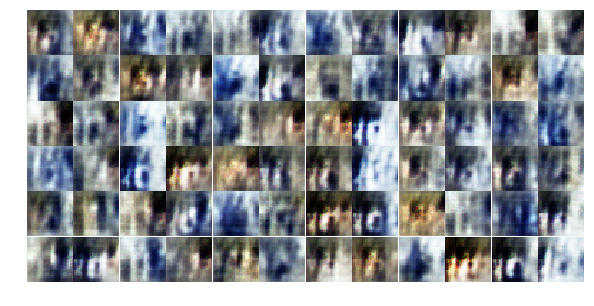

Epoch 4/25... Discriminator Loss: 0.8332... Generator Loss: 1.0907
Epoch 4/25... Discriminator Loss: 0.8310... Generator Loss: 1.1771
Epoch 4/25... Discriminator Loss: 0.7455... Generator Loss: 1.7399
Epoch 4/25... Discriminator Loss: 0.8454... Generator Loss: 1.2624
Epoch 5/25... Discriminator Loss: 0.8436... Generator Loss: 1.5203
Epoch 5/25... Discriminator Loss: 0.8127... Generator Loss: 1.3683
Epoch 5/25... Discriminator Loss: 0.8789... Generator Loss: 1.5004
Epoch 5/25... Discriminator Loss: 0.8023... Generator Loss: 1.3383
Epoch 5/25... Discriminator Loss: 0.9595... Generator Loss: 1.3333
Epoch 5/25... Discriminator Loss: 0.9458... Generator Loss: 1.1581


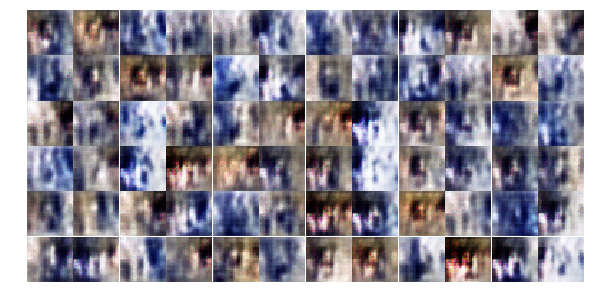

Epoch 5/25... Discriminator Loss: 0.8934... Generator Loss: 1.3490
Epoch 5/25... Discriminator Loss: 0.9296... Generator Loss: 1.3256
Epoch 5/25... Discriminator Loss: 0.9753... Generator Loss: 1.1054
Epoch 5/25... Discriminator Loss: 0.8326... Generator Loss: 1.4101
Epoch 5/25... Discriminator Loss: 0.7159... Generator Loss: 1.6516
Epoch 5/25... Discriminator Loss: 0.9412... Generator Loss: 1.1752
Epoch 5/25... Discriminator Loss: 0.8431... Generator Loss: 1.2479
Epoch 5/25... Discriminator Loss: 0.9813... Generator Loss: 0.9424
Epoch 5/25... Discriminator Loss: 0.9019... Generator Loss: 1.1658
Epoch 5/25... Discriminator Loss: 1.0164... Generator Loss: 1.0745


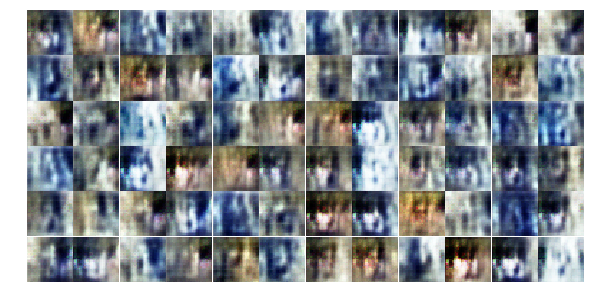

Epoch 5/25... Discriminator Loss: 1.1033... Generator Loss: 1.2060
Epoch 5/25... Discriminator Loss: 0.7861... Generator Loss: 1.7367
Epoch 5/25... Discriminator Loss: 1.1048... Generator Loss: 0.9449
Epoch 5/25... Discriminator Loss: 0.9100... Generator Loss: 1.5974
Epoch 5/25... Discriminator Loss: 0.8921... Generator Loss: 1.1978
Epoch 5/25... Discriminator Loss: 0.8354... Generator Loss: 1.2546
Epoch 5/25... Discriminator Loss: 0.9273... Generator Loss: 1.3281
Epoch 5/25... Discriminator Loss: 0.8892... Generator Loss: 1.7446
Epoch 5/25... Discriminator Loss: 0.7668... Generator Loss: 1.6673
Epoch 5/25... Discriminator Loss: 0.9480... Generator Loss: 1.2481


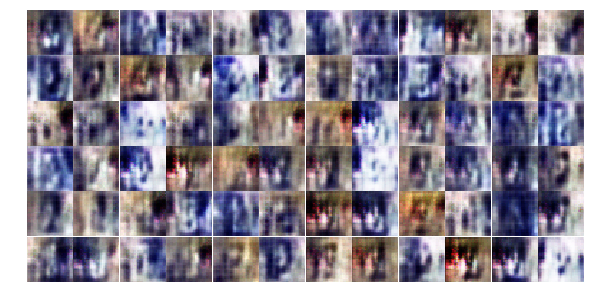

Epoch 5/25... Discriminator Loss: 1.0343... Generator Loss: 1.1235
Epoch 5/25... Discriminator Loss: 1.0921... Generator Loss: 1.0833
Epoch 5/25... Discriminator Loss: 0.9581... Generator Loss: 1.5695
Epoch 6/25... Discriminator Loss: 1.2470... Generator Loss: 0.9011
Epoch 6/25... Discriminator Loss: 1.1384... Generator Loss: 1.2357
Epoch 6/25... Discriminator Loss: 0.9324... Generator Loss: 1.2104
Epoch 6/25... Discriminator Loss: 0.9844... Generator Loss: 0.9446
Epoch 6/25... Discriminator Loss: 0.9682... Generator Loss: 0.9551
Epoch 6/25... Discriminator Loss: 1.0984... Generator Loss: 0.9715
Epoch 6/25... Discriminator Loss: 0.9524... Generator Loss: 1.0068


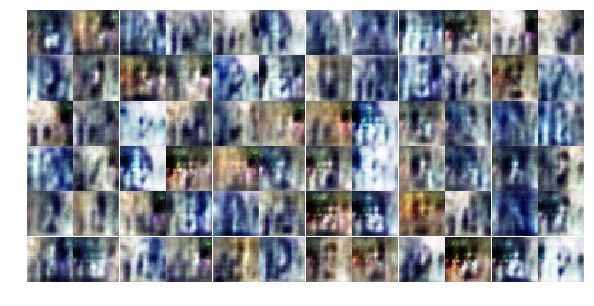

Epoch 6/25... Discriminator Loss: 0.9566... Generator Loss: 1.2895
Epoch 6/25... Discriminator Loss: 1.0809... Generator Loss: 1.1770
Epoch 6/25... Discriminator Loss: 1.1206... Generator Loss: 1.1296
Epoch 6/25... Discriminator Loss: 1.0439... Generator Loss: 1.0707
Epoch 6/25... Discriminator Loss: 1.1774... Generator Loss: 0.9440
Epoch 6/25... Discriminator Loss: 1.0753... Generator Loss: 1.0310
Epoch 6/25... Discriminator Loss: 1.0514... Generator Loss: 0.9509
Epoch 6/25... Discriminator Loss: 1.0207... Generator Loss: 1.0910
Epoch 6/25... Discriminator Loss: 1.1244... Generator Loss: 0.9164
Epoch 6/25... Discriminator Loss: 1.0205... Generator Loss: 1.0731


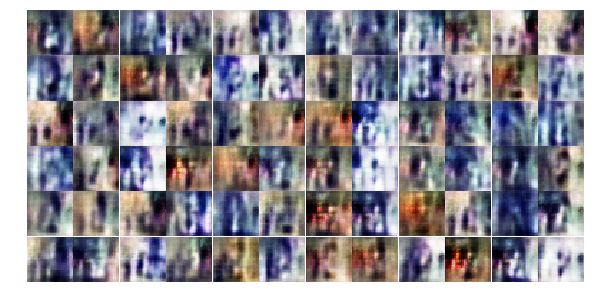

Epoch 6/25... Discriminator Loss: 0.9681... Generator Loss: 1.2138
Epoch 6/25... Discriminator Loss: 1.0448... Generator Loss: 1.1328
Epoch 6/25... Discriminator Loss: 1.0347... Generator Loss: 1.0807
Epoch 6/25... Discriminator Loss: 1.0775... Generator Loss: 0.9104
Epoch 6/25... Discriminator Loss: 1.0670... Generator Loss: 1.0589
Epoch 6/25... Discriminator Loss: 0.9995... Generator Loss: 1.1122
Epoch 6/25... Discriminator Loss: 1.0698... Generator Loss: 1.0775
Epoch 6/25... Discriminator Loss: 1.0606... Generator Loss: 1.1597
Epoch 6/25... Discriminator Loss: 1.1182... Generator Loss: 0.9258
Epoch 6/25... Discriminator Loss: 1.2127... Generator Loss: 0.8213


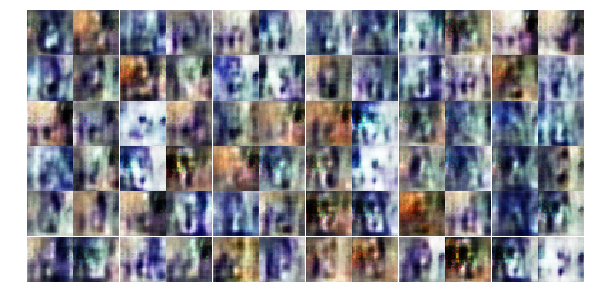

Epoch 6/25... Discriminator Loss: 0.9816... Generator Loss: 1.1176
Epoch 6/25... Discriminator Loss: 1.0993... Generator Loss: 0.8706
Epoch 7/25... Discriminator Loss: 1.0270... Generator Loss: 1.1163
Epoch 7/25... Discriminator Loss: 1.1677... Generator Loss: 1.0018
Epoch 7/25... Discriminator Loss: 1.1261... Generator Loss: 0.9255
Epoch 7/25... Discriminator Loss: 1.0808... Generator Loss: 0.9704
Epoch 7/25... Discriminator Loss: 1.1271... Generator Loss: 1.0196
Epoch 7/25... Discriminator Loss: 1.1630... Generator Loss: 0.8541
Epoch 7/25... Discriminator Loss: 1.2047... Generator Loss: 1.0172
Epoch 7/25... Discriminator Loss: 1.1565... Generator Loss: 0.9147


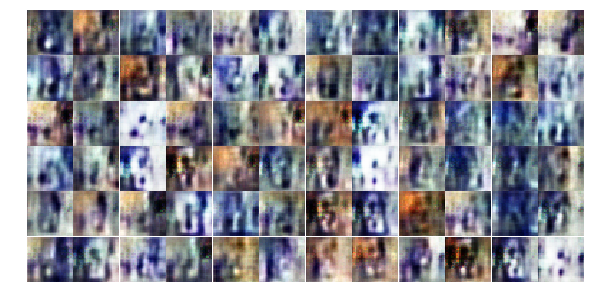

Epoch 7/25... Discriminator Loss: 1.1821... Generator Loss: 0.9523
Epoch 7/25... Discriminator Loss: 1.1045... Generator Loss: 0.9532
Epoch 7/25... Discriminator Loss: 1.1376... Generator Loss: 1.0858
Epoch 7/25... Discriminator Loss: 1.1297... Generator Loss: 0.9771
Epoch 7/25... Discriminator Loss: 0.9852... Generator Loss: 1.1671
Epoch 7/25... Discriminator Loss: 1.2197... Generator Loss: 0.7578
Epoch 7/25... Discriminator Loss: 1.1748... Generator Loss: 0.8878
Epoch 7/25... Discriminator Loss: 1.0606... Generator Loss: 1.2027
Epoch 7/25... Discriminator Loss: 1.1072... Generator Loss: 1.2980
Epoch 7/25... Discriminator Loss: 1.1381... Generator Loss: 1.0098


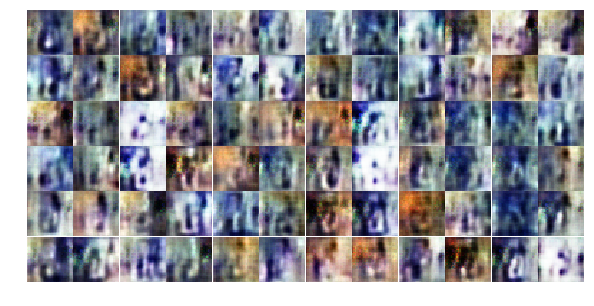

Epoch 7/25... Discriminator Loss: 1.2514... Generator Loss: 0.9318
Epoch 7/25... Discriminator Loss: 1.1248... Generator Loss: 0.8575
Epoch 7/25... Discriminator Loss: 1.1281... Generator Loss: 0.9908
Epoch 7/25... Discriminator Loss: 1.0768... Generator Loss: 0.9724
Epoch 7/25... Discriminator Loss: 1.1216... Generator Loss: 0.9692
Epoch 7/25... Discriminator Loss: 1.0522... Generator Loss: 0.9645
Epoch 7/25... Discriminator Loss: 1.0180... Generator Loss: 1.1923
Epoch 7/25... Discriminator Loss: 1.1521... Generator Loss: 0.7790
Epoch 7/25... Discriminator Loss: 1.1505... Generator Loss: 0.9491
Epoch 7/25... Discriminator Loss: 1.1587... Generator Loss: 1.0525


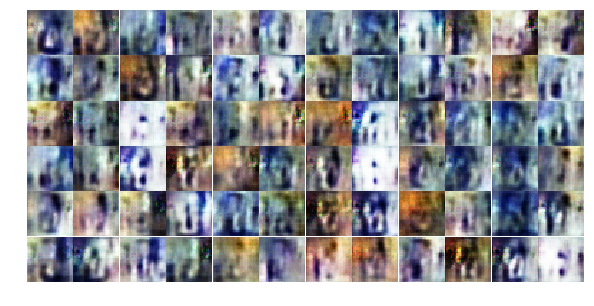

Epoch 8/25... Discriminator Loss: 1.1782... Generator Loss: 0.7600
Epoch 8/25... Discriminator Loss: 1.3090... Generator Loss: 0.8645
Epoch 8/25... Discriminator Loss: 1.2584... Generator Loss: 0.8151
Epoch 8/25... Discriminator Loss: 1.1253... Generator Loss: 1.0257
Epoch 8/25... Discriminator Loss: 1.1713... Generator Loss: 0.7778
Epoch 8/25... Discriminator Loss: 1.1222... Generator Loss: 0.8951
Epoch 8/25... Discriminator Loss: 1.1947... Generator Loss: 0.9916
Epoch 8/25... Discriminator Loss: 1.2840... Generator Loss: 0.9590
Epoch 8/25... Discriminator Loss: 1.1835... Generator Loss: 0.9420
Epoch 8/25... Discriminator Loss: 1.1154... Generator Loss: 0.9932


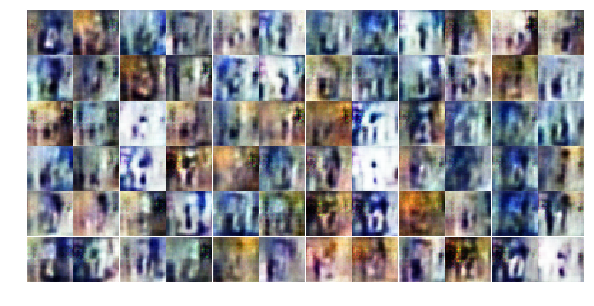

Epoch 8/25... Discriminator Loss: 1.1074... Generator Loss: 1.0106
Epoch 8/25... Discriminator Loss: 1.1306... Generator Loss: 1.0633
Epoch 8/25... Discriminator Loss: 1.0984... Generator Loss: 1.0809
Epoch 8/25... Discriminator Loss: 1.1542... Generator Loss: 0.9111
Epoch 8/25... Discriminator Loss: 1.0454... Generator Loss: 1.2001
Epoch 8/25... Discriminator Loss: 1.2261... Generator Loss: 0.8256
Epoch 8/25... Discriminator Loss: 1.2742... Generator Loss: 0.9731
Epoch 8/25... Discriminator Loss: 1.3148... Generator Loss: 0.7918
Epoch 8/25... Discriminator Loss: 1.2407... Generator Loss: 0.8454
Epoch 8/25... Discriminator Loss: 1.1042... Generator Loss: 0.9957


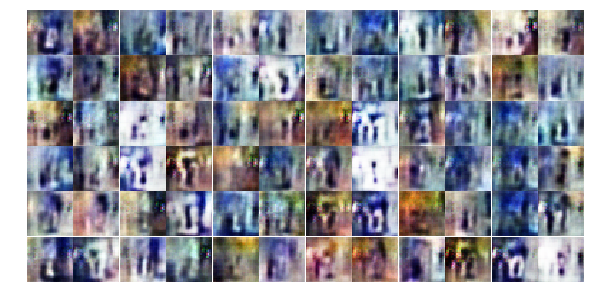

Epoch 8/25... Discriminator Loss: 1.2334... Generator Loss: 0.8394
Epoch 8/25... Discriminator Loss: 1.2627... Generator Loss: 0.7898
Epoch 8/25... Discriminator Loss: 1.2527... Generator Loss: 0.7412
Epoch 8/25... Discriminator Loss: 1.3867... Generator Loss: 0.8586
Epoch 8/25... Discriminator Loss: 1.2026... Generator Loss: 1.0210
Epoch 8/25... Discriminator Loss: 1.2158... Generator Loss: 0.9284
Epoch 8/25... Discriminator Loss: 1.0320... Generator Loss: 1.0377
Epoch 8/25... Discriminator Loss: 1.1670... Generator Loss: 0.9063
Epoch 8/25... Discriminator Loss: 1.2324... Generator Loss: 0.8779
Epoch 9/25... Discriminator Loss: 1.3324... Generator Loss: 0.6996


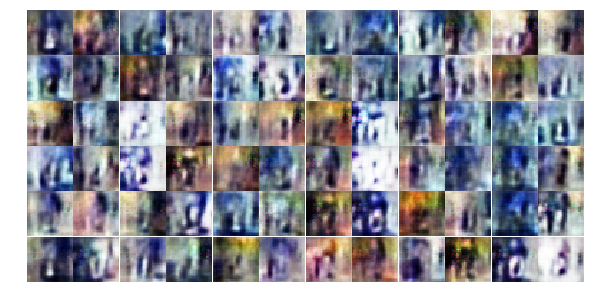

Epoch 9/25... Discriminator Loss: 1.1817... Generator Loss: 0.8678
Epoch 9/25... Discriminator Loss: 1.2106... Generator Loss: 0.7572
Epoch 9/25... Discriminator Loss: 1.1766... Generator Loss: 0.9726
Epoch 9/25... Discriminator Loss: 1.1799... Generator Loss: 0.8615
Epoch 9/25... Discriminator Loss: 1.2535... Generator Loss: 0.8929
Epoch 9/25... Discriminator Loss: 1.2377... Generator Loss: 0.7594
Epoch 9/25... Discriminator Loss: 1.2145... Generator Loss: 1.0428
Epoch 9/25... Discriminator Loss: 1.2036... Generator Loss: 1.0126
Epoch 9/25... Discriminator Loss: 1.3617... Generator Loss: 0.8410
Epoch 9/25... Discriminator Loss: 1.1932... Generator Loss: 0.9391


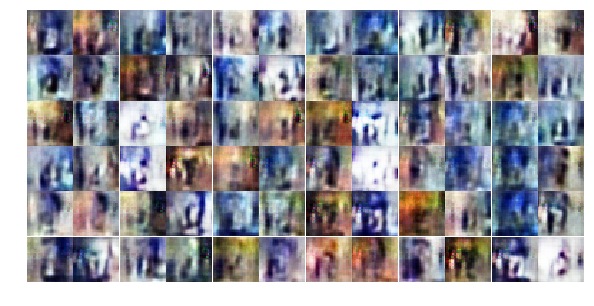

Epoch 9/25... Discriminator Loss: 1.1092... Generator Loss: 1.0576
Epoch 9/25... Discriminator Loss: 1.2258... Generator Loss: 0.8659
Epoch 9/25... Discriminator Loss: 1.1485... Generator Loss: 1.1010
Epoch 9/25... Discriminator Loss: 1.1241... Generator Loss: 1.0183
Epoch 9/25... Discriminator Loss: 1.1972... Generator Loss: 0.9273
Epoch 9/25... Discriminator Loss: 1.2639... Generator Loss: 0.9401
Epoch 9/25... Discriminator Loss: 1.2871... Generator Loss: 0.8432
Epoch 9/25... Discriminator Loss: 1.1930... Generator Loss: 0.8824
Epoch 9/25... Discriminator Loss: 1.2598... Generator Loss: 0.9166
Epoch 9/25... Discriminator Loss: 1.1624... Generator Loss: 1.0940


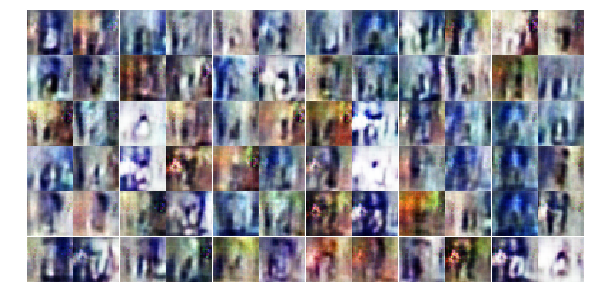

Epoch 9/25... Discriminator Loss: 1.3376... Generator Loss: 0.7350
Epoch 9/25... Discriminator Loss: 1.2281... Generator Loss: 0.9984
Epoch 9/25... Discriminator Loss: 1.3268... Generator Loss: 0.7700
Epoch 9/25... Discriminator Loss: 1.2904... Generator Loss: 0.7285
Epoch 9/25... Discriminator Loss: 1.3427... Generator Loss: 0.8131
Epoch 9/25... Discriminator Loss: 1.1503... Generator Loss: 0.9806
Epoch 9/25... Discriminator Loss: 1.3094... Generator Loss: 0.8704
Epoch 9/25... Discriminator Loss: 1.1705... Generator Loss: 1.0807
Epoch 10/25... Discriminator Loss: 1.2140... Generator Loss: 0.8077
Epoch 10/25... Discriminator Loss: 1.1473... Generator Loss: 1.0123


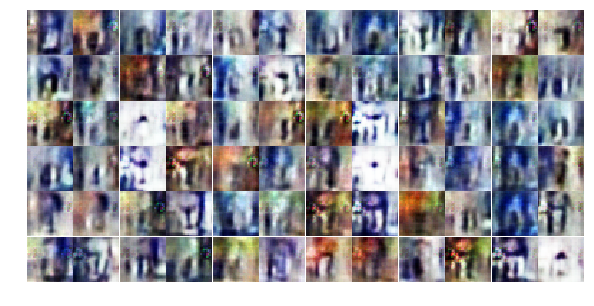

Epoch 10/25... Discriminator Loss: 1.3021... Generator Loss: 0.8674
Epoch 10/25... Discriminator Loss: 1.2315... Generator Loss: 0.9892
Epoch 10/25... Discriminator Loss: 1.2253... Generator Loss: 0.9859
Epoch 10/25... Discriminator Loss: 1.2116... Generator Loss: 0.9385
Epoch 10/25... Discriminator Loss: 1.2709... Generator Loss: 0.8528
Epoch 10/25... Discriminator Loss: 1.2408... Generator Loss: 0.8358
Epoch 10/25... Discriminator Loss: 1.2018... Generator Loss: 0.9262
Epoch 10/25... Discriminator Loss: 1.2644... Generator Loss: 0.7861
Epoch 10/25... Discriminator Loss: 1.2168... Generator Loss: 0.9166
Epoch 10/25... Discriminator Loss: 1.3168... Generator Loss: 0.8354


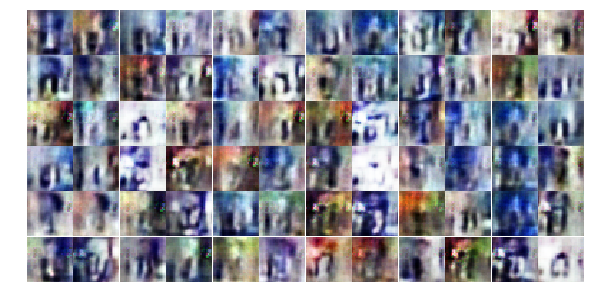

Epoch 10/25... Discriminator Loss: 1.3363... Generator Loss: 0.8112
Epoch 10/25... Discriminator Loss: 1.2972... Generator Loss: 0.8835
Epoch 10/25... Discriminator Loss: 1.2302... Generator Loss: 0.9046
Epoch 10/25... Discriminator Loss: 1.2987... Generator Loss: 0.8201
Epoch 10/25... Discriminator Loss: 1.3542... Generator Loss: 0.7647
Epoch 10/25... Discriminator Loss: 1.1985... Generator Loss: 0.9398
Epoch 10/25... Discriminator Loss: 1.3180... Generator Loss: 0.5938
Epoch 10/25... Discriminator Loss: 1.2432... Generator Loss: 0.8522
Epoch 10/25... Discriminator Loss: 1.1982... Generator Loss: 0.9405
Epoch 10/25... Discriminator Loss: 1.2275... Generator Loss: 0.9332


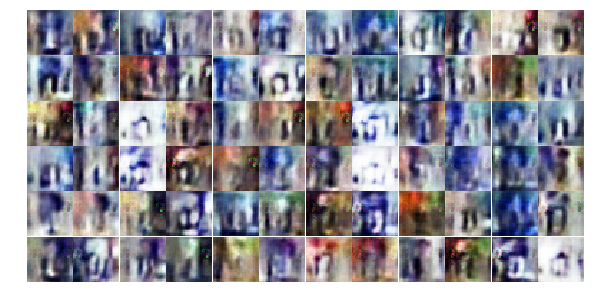

Epoch 10/25... Discriminator Loss: 1.2279... Generator Loss: 0.8781
Epoch 10/25... Discriminator Loss: 1.2130... Generator Loss: 0.8883
Epoch 10/25... Discriminator Loss: 1.2192... Generator Loss: 0.9451
Epoch 10/25... Discriminator Loss: 1.2697... Generator Loss: 0.9120
Epoch 10/25... Discriminator Loss: 1.2343... Generator Loss: 0.9712
Epoch 10/25... Discriminator Loss: 1.2607... Generator Loss: 0.8626
Epoch 10/25... Discriminator Loss: 1.0491... Generator Loss: 1.0712
Epoch 11/25... Discriminator Loss: 1.2513... Generator Loss: 0.8161
Epoch 11/25... Discriminator Loss: 1.2873... Generator Loss: 0.8431
Epoch 11/25... Discriminator Loss: 1.2825... Generator Loss: 0.8382


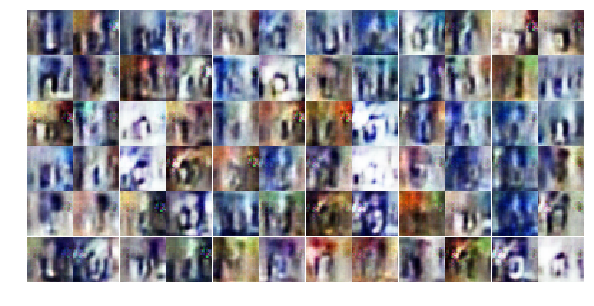

Epoch 11/25... Discriminator Loss: 1.2341... Generator Loss: 1.0009
Epoch 11/25... Discriminator Loss: 1.1363... Generator Loss: 1.1775
Epoch 11/25... Discriminator Loss: 1.3258... Generator Loss: 0.7975
Epoch 11/25... Discriminator Loss: 1.2619... Generator Loss: 0.8951
Epoch 11/25... Discriminator Loss: 1.2197... Generator Loss: 0.9654
Epoch 11/25... Discriminator Loss: 1.3368... Generator Loss: 0.8760
Epoch 11/25... Discriminator Loss: 1.2394... Generator Loss: 0.8601
Epoch 11/25... Discriminator Loss: 1.3163... Generator Loss: 0.9381
Epoch 11/25... Discriminator Loss: 1.2556... Generator Loss: 0.8395
Epoch 11/25... Discriminator Loss: 1.2689... Generator Loss: 0.7829


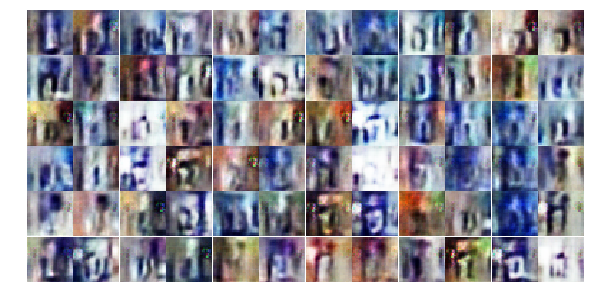

Epoch 11/25... Discriminator Loss: 1.2454... Generator Loss: 0.8904
Epoch 11/25... Discriminator Loss: 1.2769... Generator Loss: 0.8340
Epoch 11/25... Discriminator Loss: 1.2044... Generator Loss: 0.8477
Epoch 11/25... Discriminator Loss: 1.2324... Generator Loss: 0.8979
Epoch 11/25... Discriminator Loss: 1.2775... Generator Loss: 0.8362
Epoch 11/25... Discriminator Loss: 1.2940... Generator Loss: 0.8469
Epoch 11/25... Discriminator Loss: 1.1607... Generator Loss: 0.9599
Epoch 11/25... Discriminator Loss: 1.2768... Generator Loss: 0.8484
Epoch 11/25... Discriminator Loss: 1.2741... Generator Loss: 0.9640
Epoch 11/25... Discriminator Loss: 1.3124... Generator Loss: 0.6955


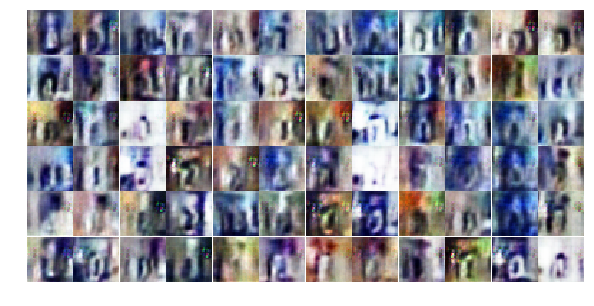

Epoch 11/25... Discriminator Loss: 1.2718... Generator Loss: 0.7707
Epoch 11/25... Discriminator Loss: 1.2311... Generator Loss: 0.9698
Epoch 11/25... Discriminator Loss: 1.1866... Generator Loss: 0.9991
Epoch 11/25... Discriminator Loss: 1.2629... Generator Loss: 0.9152
Epoch 11/25... Discriminator Loss: 1.2903... Generator Loss: 0.9106
Epoch 12/25... Discriminator Loss: 1.2593... Generator Loss: 0.8688
Epoch 12/25... Discriminator Loss: 1.3037... Generator Loss: 0.7836
Epoch 12/25... Discriminator Loss: 1.2757... Generator Loss: 0.9625
Epoch 12/25... Discriminator Loss: 1.2467... Generator Loss: 0.7902
Epoch 12/25... Discriminator Loss: 1.1744... Generator Loss: 0.9579


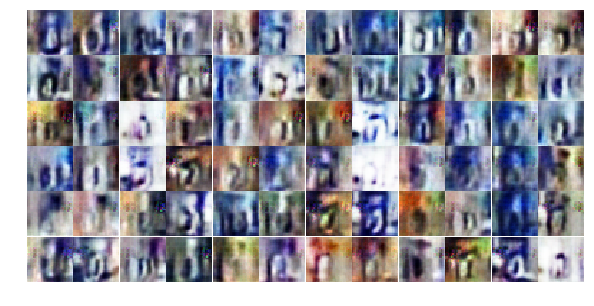

Epoch 12/25... Discriminator Loss: 1.3212... Generator Loss: 0.8978
Epoch 12/25... Discriminator Loss: 1.2210... Generator Loss: 0.9227
Epoch 12/25... Discriminator Loss: 1.2264... Generator Loss: 0.9451
Epoch 12/25... Discriminator Loss: 1.2125... Generator Loss: 0.9662
Epoch 12/25... Discriminator Loss: 1.2966... Generator Loss: 0.7812
Epoch 12/25... Discriminator Loss: 1.1897... Generator Loss: 1.0190
Epoch 12/25... Discriminator Loss: 1.2471... Generator Loss: 0.8236
Epoch 12/25... Discriminator Loss: 1.2196... Generator Loss: 0.8482
Epoch 12/25... Discriminator Loss: 1.3208... Generator Loss: 0.7200
Epoch 12/25... Discriminator Loss: 1.2620... Generator Loss: 0.8777


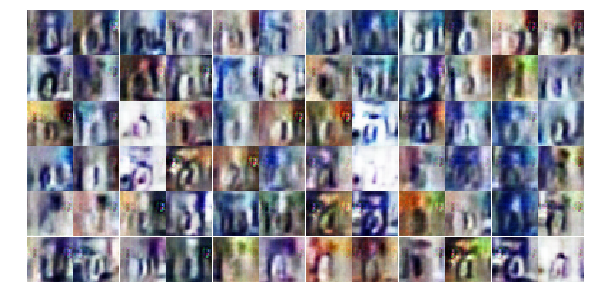

Epoch 12/25... Discriminator Loss: 1.1573... Generator Loss: 1.0086
Epoch 12/25... Discriminator Loss: 1.1663... Generator Loss: 0.8772
Epoch 12/25... Discriminator Loss: 1.3322... Generator Loss: 0.7480
Epoch 12/25... Discriminator Loss: 1.2941... Generator Loss: 0.9310
Epoch 12/25... Discriminator Loss: 1.3047... Generator Loss: 0.8368
Epoch 12/25... Discriminator Loss: 1.3095... Generator Loss: 0.8957
Epoch 12/25... Discriminator Loss: 1.2326... Generator Loss: 0.9198
Epoch 12/25... Discriminator Loss: 1.2094... Generator Loss: 1.0753
Epoch 12/25... Discriminator Loss: 1.2588... Generator Loss: 0.7615
Epoch 12/25... Discriminator Loss: 1.2986... Generator Loss: 0.7776


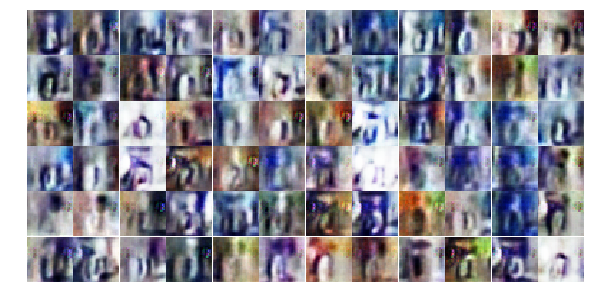

Epoch 12/25... Discriminator Loss: 1.2313... Generator Loss: 0.9596
Epoch 12/25... Discriminator Loss: 1.2561... Generator Loss: 0.8294
Epoch 12/25... Discriminator Loss: 1.1999... Generator Loss: 0.8744
Epoch 12/25... Discriminator Loss: 1.2673... Generator Loss: 0.8302
Epoch 13/25... Discriminator Loss: 1.1210... Generator Loss: 0.9140
Epoch 13/25... Discriminator Loss: 1.2915... Generator Loss: 0.6958
Epoch 13/25... Discriminator Loss: 1.2905... Generator Loss: 0.8112
Epoch 13/25... Discriminator Loss: 1.3680... Generator Loss: 0.6594
Epoch 13/25... Discriminator Loss: 1.3378... Generator Loss: 0.8167
Epoch 13/25... Discriminator Loss: 1.2284... Generator Loss: 0.8394


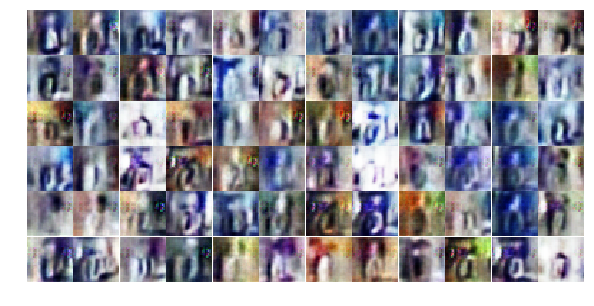

Epoch 13/25... Discriminator Loss: 1.3649... Generator Loss: 0.6644
Epoch 13/25... Discriminator Loss: 1.2436... Generator Loss: 0.7489
Epoch 13/25... Discriminator Loss: 1.2346... Generator Loss: 0.9141
Epoch 13/25... Discriminator Loss: 1.3231... Generator Loss: 0.7637
Epoch 13/25... Discriminator Loss: 1.1717... Generator Loss: 0.8658
Epoch 13/25... Discriminator Loss: 1.2544... Generator Loss: 0.8073
Epoch 13/25... Discriminator Loss: 1.1634... Generator Loss: 0.9613
Epoch 13/25... Discriminator Loss: 1.2391... Generator Loss: 0.8148
Epoch 13/25... Discriminator Loss: 1.2795... Generator Loss: 0.8489
Epoch 13/25... Discriminator Loss: 1.3167... Generator Loss: 0.8195


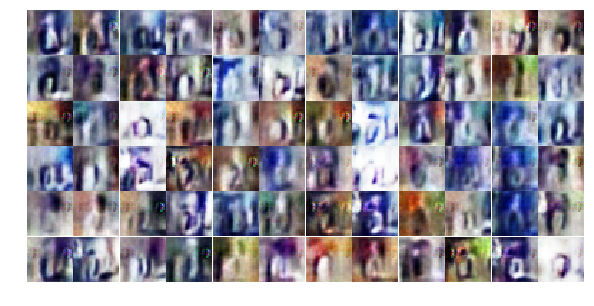

Epoch 13/25... Discriminator Loss: 1.3258... Generator Loss: 0.8294
Epoch 13/25... Discriminator Loss: 1.3697... Generator Loss: 0.7660
Epoch 13/25... Discriminator Loss: 1.2830... Generator Loss: 0.8937
Epoch 13/25... Discriminator Loss: 1.2067... Generator Loss: 0.9233
Epoch 13/25... Discriminator Loss: 1.2763... Generator Loss: 0.8694
Epoch 13/25... Discriminator Loss: 1.2638... Generator Loss: 0.8570
Epoch 13/25... Discriminator Loss: 1.1381... Generator Loss: 0.9691
Epoch 13/25... Discriminator Loss: 1.2332... Generator Loss: 0.8427
Epoch 13/25... Discriminator Loss: 1.2433... Generator Loss: 0.8374
Epoch 13/25... Discriminator Loss: 1.2315... Generator Loss: 0.8708


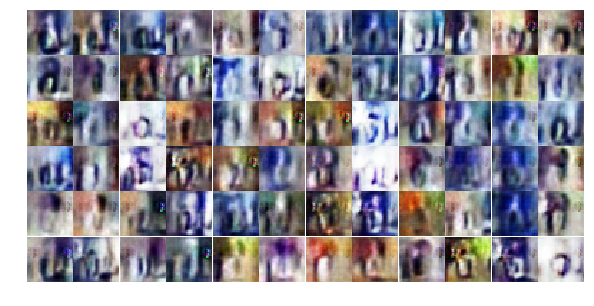

Epoch 13/25... Discriminator Loss: 1.3180... Generator Loss: 0.7571
Epoch 13/25... Discriminator Loss: 1.2337... Generator Loss: 0.8220
Epoch 13/25... Discriminator Loss: 1.2460... Generator Loss: 0.8647
Epoch 14/25... Discriminator Loss: 1.2486... Generator Loss: 0.8660
Epoch 14/25... Discriminator Loss: 1.2722... Generator Loss: 0.8216
Epoch 14/25... Discriminator Loss: 1.2699... Generator Loss: 0.8001
Epoch 14/25... Discriminator Loss: 1.3322... Generator Loss: 0.7226
Epoch 14/25... Discriminator Loss: 1.2951... Generator Loss: 0.8263
Epoch 14/25... Discriminator Loss: 1.2328... Generator Loss: 0.8819
Epoch 14/25... Discriminator Loss: 1.3113... Generator Loss: 0.7607


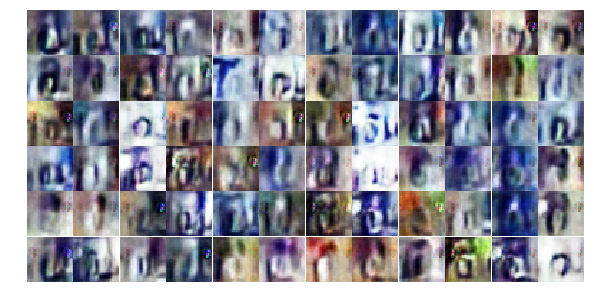

Epoch 14/25... Discriminator Loss: 1.2867... Generator Loss: 0.8170
Epoch 14/25... Discriminator Loss: 1.2616... Generator Loss: 0.8236
Epoch 14/25... Discriminator Loss: 1.2846... Generator Loss: 0.6933
Epoch 14/25... Discriminator Loss: 1.3178... Generator Loss: 0.9037
Epoch 14/25... Discriminator Loss: 1.3249... Generator Loss: 0.8315
Epoch 14/25... Discriminator Loss: 1.2147... Generator Loss: 0.8826
Epoch 14/25... Discriminator Loss: 1.3234... Generator Loss: 0.9271
Epoch 14/25... Discriminator Loss: 1.2499... Generator Loss: 0.9642
Epoch 14/25... Discriminator Loss: 1.3380... Generator Loss: 0.6346
Epoch 14/25... Discriminator Loss: 1.2069... Generator Loss: 0.8119


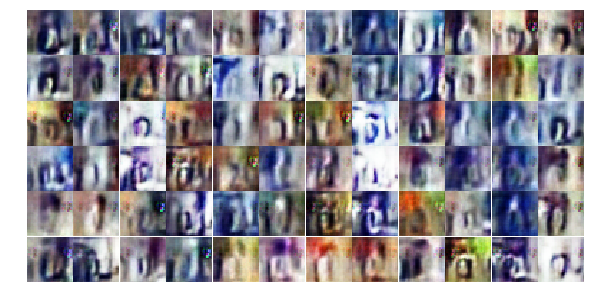

Epoch 14/25... Discriminator Loss: 1.2403... Generator Loss: 0.8923
Epoch 14/25... Discriminator Loss: 1.3194... Generator Loss: 0.6955
Epoch 14/25... Discriminator Loss: 1.2834... Generator Loss: 0.8878
Epoch 14/25... Discriminator Loss: 1.2958... Generator Loss: 0.8917
Epoch 14/25... Discriminator Loss: 1.3699... Generator Loss: 0.7922
Epoch 14/25... Discriminator Loss: 1.2485... Generator Loss: 0.9407
Epoch 14/25... Discriminator Loss: 1.2417... Generator Loss: 0.9469
Epoch 14/25... Discriminator Loss: 1.3335... Generator Loss: 0.6978
Epoch 14/25... Discriminator Loss: 1.2496... Generator Loss: 1.0323
Epoch 14/25... Discriminator Loss: 1.3037... Generator Loss: 0.8335


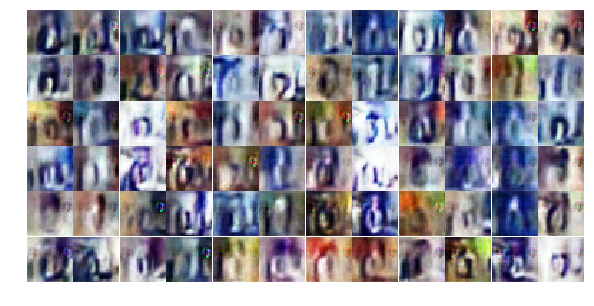

Epoch 14/25... Discriminator Loss: 1.2589... Generator Loss: 0.8384
Epoch 15/25... Discriminator Loss: 1.2717... Generator Loss: 0.9648
Epoch 15/25... Discriminator Loss: 1.1813... Generator Loss: 1.0275
Epoch 15/25... Discriminator Loss: 1.3195... Generator Loss: 0.9010
Epoch 15/25... Discriminator Loss: 1.2558... Generator Loss: 0.9149
Epoch 15/25... Discriminator Loss: 1.1675... Generator Loss: 0.9394
Epoch 15/25... Discriminator Loss: 1.3306... Generator Loss: 0.7151
Epoch 15/25... Discriminator Loss: 1.3131... Generator Loss: 0.7907
Epoch 15/25... Discriminator Loss: 1.3000... Generator Loss: 0.7600
Epoch 15/25... Discriminator Loss: 1.2760... Generator Loss: 0.8636


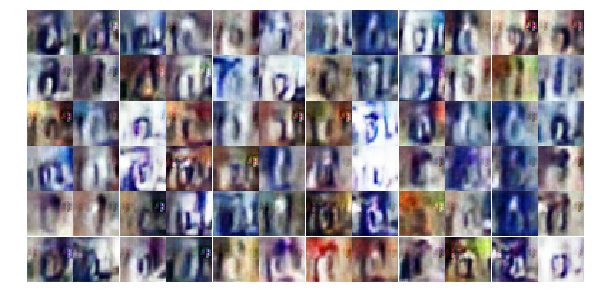

Epoch 15/25... Discriminator Loss: 1.2765... Generator Loss: 0.8622
Epoch 15/25... Discriminator Loss: 1.2240... Generator Loss: 0.7938
Epoch 15/25... Discriminator Loss: 1.2711... Generator Loss: 0.8767
Epoch 15/25... Discriminator Loss: 1.2997... Generator Loss: 0.8004
Epoch 15/25... Discriminator Loss: 1.3303... Generator Loss: 0.8182
Epoch 15/25... Discriminator Loss: 1.2150... Generator Loss: 0.8629
Epoch 15/25... Discriminator Loss: 1.3741... Generator Loss: 0.7782
Epoch 15/25... Discriminator Loss: 1.2576... Generator Loss: 0.8720
Epoch 15/25... Discriminator Loss: 1.3159... Generator Loss: 0.7784
Epoch 15/25... Discriminator Loss: 1.2988... Generator Loss: 0.8651


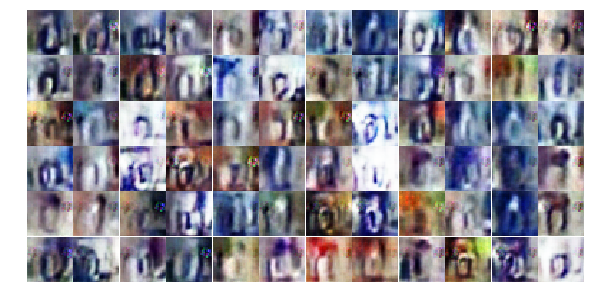

Epoch 15/25... Discriminator Loss: 1.2361... Generator Loss: 0.9273
Epoch 15/25... Discriminator Loss: 1.3341... Generator Loss: 0.7637
Epoch 15/25... Discriminator Loss: 1.3119... Generator Loss: 0.7940
Epoch 15/25... Discriminator Loss: 1.2347... Generator Loss: 0.9116
Epoch 15/25... Discriminator Loss: 1.3412... Generator Loss: 0.7632
Epoch 15/25... Discriminator Loss: 1.2220... Generator Loss: 0.8092
Epoch 15/25... Discriminator Loss: 1.3211... Generator Loss: 0.7274
Epoch 15/25... Discriminator Loss: 1.2052... Generator Loss: 0.9321
Epoch 15/25... Discriminator Loss: 1.2232... Generator Loss: 0.9283
Epoch 15/25... Discriminator Loss: 1.2778... Generator Loss: 0.9183


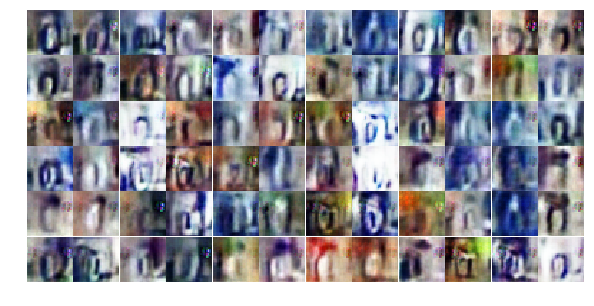

Epoch 16/25... Discriminator Loss: 1.3167... Generator Loss: 0.8812
Epoch 16/25... Discriminator Loss: 1.3160... Generator Loss: 0.8451
Epoch 16/25... Discriminator Loss: 1.2444... Generator Loss: 0.8321
Epoch 16/25... Discriminator Loss: 1.2330... Generator Loss: 0.8361
Epoch 16/25... Discriminator Loss: 1.2741... Generator Loss: 0.8245
Epoch 16/25... Discriminator Loss: 1.2357... Generator Loss: 0.8229
Epoch 16/25... Discriminator Loss: 1.1687... Generator Loss: 1.0036
Epoch 16/25... Discriminator Loss: 1.2589... Generator Loss: 0.8922
Epoch 16/25... Discriminator Loss: 1.2442... Generator Loss: 0.8463
Epoch 16/25... Discriminator Loss: 1.2092... Generator Loss: 0.9308


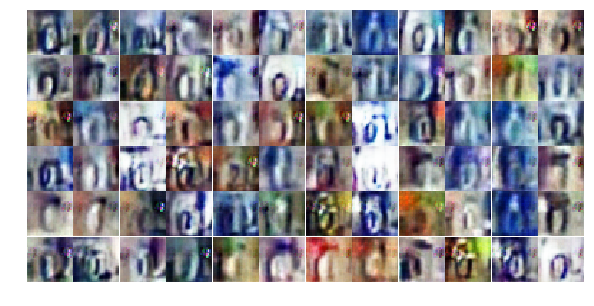

Epoch 16/25... Discriminator Loss: 1.2924... Generator Loss: 0.8822
Epoch 16/25... Discriminator Loss: 1.2444... Generator Loss: 0.9463
Epoch 16/25... Discriminator Loss: 1.3026... Generator Loss: 0.8326
Epoch 16/25... Discriminator Loss: 1.2256... Generator Loss: 0.7806
Epoch 16/25... Discriminator Loss: 1.3602... Generator Loss: 0.7658
Epoch 16/25... Discriminator Loss: 1.3399... Generator Loss: 0.7494
Epoch 16/25... Discriminator Loss: 1.3545... Generator Loss: 0.6674
Epoch 16/25... Discriminator Loss: 1.1983... Generator Loss: 1.0495
Epoch 16/25... Discriminator Loss: 1.2889... Generator Loss: 0.9361
Epoch 16/25... Discriminator Loss: 1.2484... Generator Loss: 0.8986


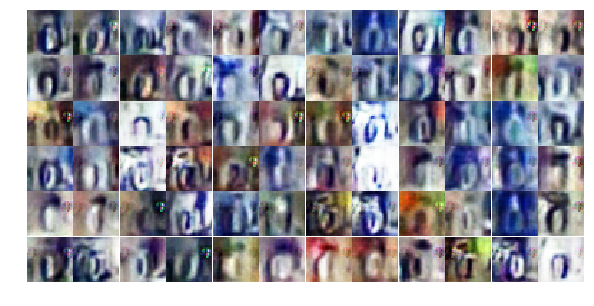

Epoch 16/25... Discriminator Loss: 1.3780... Generator Loss: 0.6584
Epoch 16/25... Discriminator Loss: 1.3136... Generator Loss: 0.7659
Epoch 16/25... Discriminator Loss: 1.1882... Generator Loss: 0.8694
Epoch 16/25... Discriminator Loss: 1.3659... Generator Loss: 0.7229
Epoch 16/25... Discriminator Loss: 1.3240... Generator Loss: 0.8803
Epoch 16/25... Discriminator Loss: 1.2560... Generator Loss: 0.8598
Epoch 16/25... Discriminator Loss: 1.3079... Generator Loss: 0.8155
Epoch 16/25... Discriminator Loss: 1.2568... Generator Loss: 0.8722
Epoch 16/25... Discriminator Loss: 1.2736... Generator Loss: 0.8776
Epoch 17/25... Discriminator Loss: 1.3251... Generator Loss: 0.8396


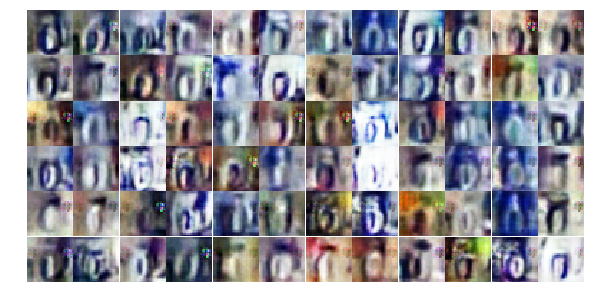

Epoch 17/25... Discriminator Loss: 1.3477... Generator Loss: 0.7807
Epoch 17/25... Discriminator Loss: 1.2336... Generator Loss: 0.9744
Epoch 17/25... Discriminator Loss: 1.2905... Generator Loss: 0.7574
Epoch 17/25... Discriminator Loss: 1.2060... Generator Loss: 0.9814
Epoch 17/25... Discriminator Loss: 1.3410... Generator Loss: 0.7866
Epoch 17/25... Discriminator Loss: 1.2744... Generator Loss: 0.8726
Epoch 17/25... Discriminator Loss: 1.2690... Generator Loss: 0.8414
Epoch 17/25... Discriminator Loss: 1.3636... Generator Loss: 0.6143
Epoch 17/25... Discriminator Loss: 1.2672... Generator Loss: 0.9508
Epoch 17/25... Discriminator Loss: 1.3613... Generator Loss: 0.7191


In [ ]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

In [ ]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

In [ ]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))